In [65]:
import copy
import sys
sys.path.insert(0, "..")
from classes.atom_classes.atom import Atom
from classes.atom_classes.atom_collection import Atom_Collection
from classes.atom_classes.atom_collection_plotter import Animator, Atom_Collection_Plotter
from classes.calculators.lennardjones import LennardJones
from classes.optimizers.random_struct_search import Line_searcher1
from classes.optimizers.md_simulator1 import MDT_simulator
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
plt.rc('animation', html='jshtml')

In [66]:
class Atom_plotter(Animator):
    def __init__(self, default_cols=("C0", "C1"), markersize=50, scale_with_mass=False, alpha=1) -> None:
        super().__init__(default_cols, markersize, scale_with_mass, alpha)
    
    def animate(self, i, atom_col, position, plot_several_cells=False):
        atom_col.set_atom_positions(position)
        plot_elems_atoms = self(atom_col)
        add_plot_elems = []
        if plot_several_cells == False:
            pass
        else:
            add_plot_elems = self.plot_several_cells(atom_col=atom_col)
            add_plot_elems = [f for d in add_plot_elems
                                for l in d
                                for f in l]
        return plot_elems_atoms["atoms"] + add_plot_elems

In [67]:
pos_flat = np.loadtxt('../Week4/lj10clusters.txt')
positions = pos_flat.reshape(-1,pos_flat.shape[1]//2,2)[12]
atom_list = [Atom(position=pos) for pos in positions+np.array([5.0,6.0])]
unit_cell = (np.array([10.0,0]), np.array([0.0,10.0]))
atom_col_no_per = Atom_Collection(atomlist=atom_list, unit_cell=unit_cell)
atom_col_no_per.calculator = LennardJones()
atom_list = [Atom(position=pos) for pos in positions+np.array([10.0,11.0])]
atom_col_per = Atom_Collection(atomlist=atom_list, unit_cell=unit_cell, pbc=True)
atom_col_per.calculator = LennardJones(pbc=True, pbc_handler=atom_col_per.pbc_handler)

(-10.0, 20.0)

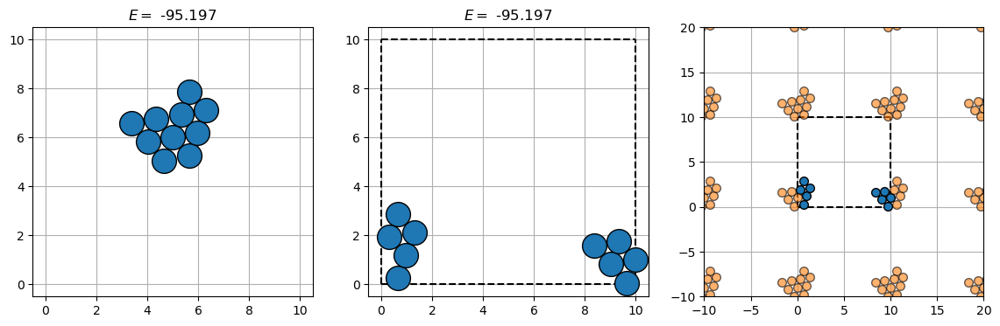

In [68]:
fig, axs = plt.subplots(1,3, figsize=(14,4))
atom_cols = [atom_col_no_per, atom_col_per]

atom_plotter = Atom_plotter(markersize=20)

for ax, atom_col, unit_cell_plot in zip(axs[0:2], atom_cols, [False, True]):
    ax.grid()
    ax.set_xlim([-0.5,10.5])
    ax.set_ylim([-0.5,10.5])
    atom_plotter(atom_col=atom_col, ax=ax, plot_cell=unit_cell_plot)
    atom_col.reset_plot_axes()
    ax.set_title(rf"$E=$ {atom_col.get_potential_energy().round(3)}")

atom_plotter.markersize = 7
atom_plotter(atom_col=atom_col_per, ax=axs[2], plot_cell=True)
atom_plotter.plot_several_cells(atom_col=atom_col_per)
atom_col_per.reset_plot_axes()
#atom_col_per.plot_cells(ax=axs[2], size=7.5)
#atom_col_per.reset_plot_axes()
axs[2].grid()
axs[2].set_xlim([-10.0,20.0])
axs[2].set_ylim([-10.0,20.0])
#atom_col_per.set_sizes([20 for i in range(len(atom_col_per))])

In [114]:
positions = pos_flat.reshape(-1,pos_flat.shape[1]//2,2)[3]
atom_list = [Atom(position=pos) for pos in positions+np.array([6.0,6.0])]
unit_cell = (np.array([10.0,2.0]), np.array([5.0,10.0]))
atom_col_no_per = Atom_Collection(atomlist=atom_list, unit_cell=unit_cell, pbc=False)
atom_col_no_per.calculator = LennardJones()
#atom_col_no_per.positions
atom_list = [Atom(position=pos) for pos in positions+np.array([9.5,3.0])]
atom_col_per = Atom_Collection(atomlist=atom_list, unit_cell=unit_cell, pbc=True)
atom_col_per.calculator = LennardJones(pbc=True, pbc_handler=atom_col_per.pbc_handler)

(-10.0, 20.0)

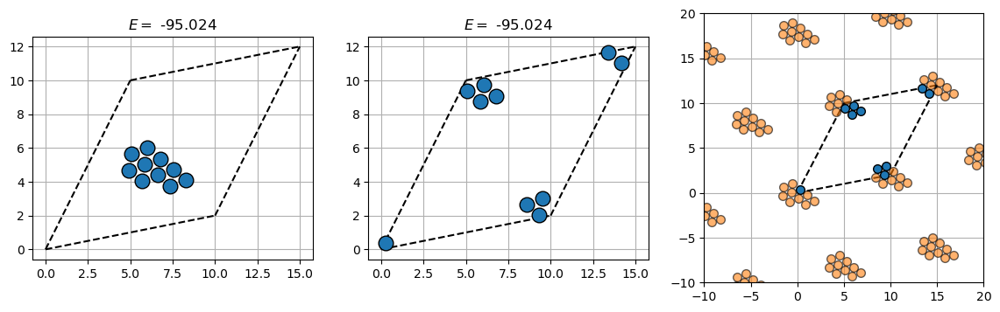

In [115]:
fig, axs = plt.subplots(1,3, figsize=(14,4))
atom_cols = [atom_col_no_per, atom_col_per]

atom_plotter = Atom_plotter(markersize=12)

for ax, atom_col in zip(axs[0:2], atom_cols):
    ax.grid()
    atom_plotter(atom_col=atom_col, ax=ax, plot_cell=True)
    atom_col.reset_plot_axes()
    ax.set_aspect("equal")
    ax.set_title(rf"$E=$ {atom_col.get_potential_energy().round(3)}")

atom_plotter.markersize=7
atom_plotter(atom_col=atom_col_per, ax=axs[2], plot_cell=True)
atom_plotter.plot_several_cells(atom_col=atom_col_per)
atom_col_per.reset_plot_axes()
axs[2].grid()
axs[2].set_xlim([-10.0,20.0])
axs[2].set_ylim([-10.0,20.0])

In [116]:
atom_list = [Atom(position=pos) for pos in positions+np.array([6.0,6.0])]
atom_col_per = Atom_Collection(atomlist=atom_list, unit_cell=unit_cell, pbc=True)

velocities = np.zeros(shape=atom_col.velocities.shape)
#np.array([10.0,2.0])
angle = (np.arctan(10.0/5.0) - np.arctan(2.0/10.0))/2 + np.arctan(2.0/10.0)# + np.pi/4 #np.pi/4 + np.arctan(2.0/10.0)
for i in range(len(velocities)):
    velocities[i] = 1.5*np.array([np.cos(angle), np.sin(angle)])
atom_col_per.set_velocities(velocities)
atom_col_per.calculator = LennardJones(pbc=True, pbc_handler=atom_col_per.pbc_handler)
md_simulator = MDT_simulator(atom_col=atom_col_per, temp=0.05, log_level="all_steps")
md_simulator.N2_integration(time_step=0.01, integrate_steps=2000)

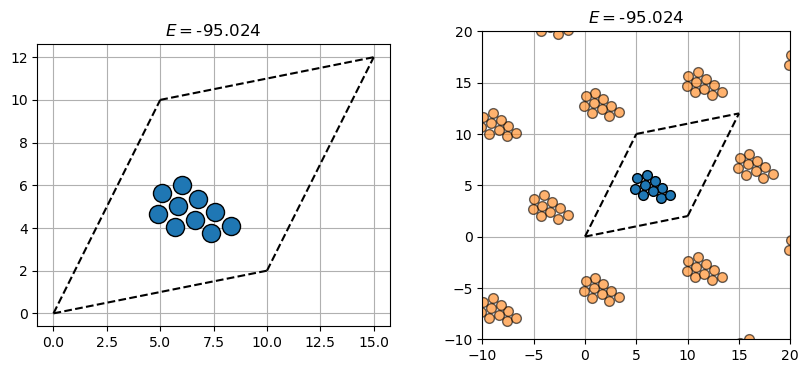

In [120]:
fig, axs = plt.subplots(1,2, figsize=(10,4))
for ax in axs:
    ax.grid()

atom_plotters = [Atom_plotter(markersize=13), Atom_plotter(markersize=7)]
axs[1].set_xlim([-10.0,20.0])
axs[1].set_ylim([-10.0,20.0])

logged_atom_cols = md_simulator.logged_atom_cols
plot_cols = [copy.deepcopy(logged_atom_cols[0]) for _ in range(2)]
for plot_col,ax,atom_plotter in zip(plot_cols,axs, atom_plotters):
    atom_plotter(atom_col=plot_col, ax=ax, plot_cell=True)
    ax.set_aspect("equal")
    ax.set_title(rf"$E=${atom_col.get_potential_energy().round(3)}")
l = atom_plotters[1].plot_several_cells(atom_col=plot_cols[1], ax=axs[1])

In [123]:
def update(i, plot_cols, atom_cols, atom_plotters, plot_several_cells, axs):
    position = atom_cols[i].positions
    plot_elems = []
    for plot_col, atom_plotter, plot_several_cell, ax in zip(plot_cols, atom_plotters, plot_several_cells, axs):
        plot_elems += atom_plotter.animate(i, plot_col, position, plot_several_cell)
        ax.set_title(rf"$E=${atom_cols[i].get_potential_energy().round(3)}")
    return plot_elems

In [124]:
anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, 1999, 10),
                               fargs=(plot_cols, logged_atom_cols, atom_plotters, (False, True), axs),
                               interval=75,
                               blit=True)
anim

In [ ]:
writer = animation.PillowWriter(fps=15,
                                 metadata=dict(artist='Me'),
                                 bitrate=1800)
anim.save("periodicity.gif", writer=writer)